In [1]:
import torch
from torchvision import transforms, datasets
import numpy as np
torch.set_grad_enabled(False)
from torch import nn
# device_ids = [0, 1, 2, 3]
device_ids = [0, ]
torch.cuda.set_device(device_ids[0])
torch.multiprocessing.set_sharing_strategy('file_system')
%load_ext autoreload
%autoreload 2

/home/nguyen/miniconda3/envs/ProNos/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from models.basic_template import TrainTask

dataset_name = 'ocr_dataset'
# dataset_name = 'imagenet'
test_transform = transforms.Compose([
    transforms.Resize( (128, 128)),
    # transforms.CenterCrop(224),
    transforms.ToTensor(),
    # TrainTask.normalize(dataset_name)
])
train_dataset = TrainTask.create_dataset(
    data_root='/home/nguyen/NTT/OCR/ProPos/DATA/',
    dataset_name=dataset_name,
    train=True,
    transform=test_transform,
    memory=True,
)[0]
# dataset = torch.utils.data.ConcatDataset([create_dataset(), create_dataset(False)])
train_loader = torch.utils.data.DataLoader(train_dataset,
                                           batch_size=64,
                                           shuffle=False,
                                           num_workers=4)
test_dataset = TrainTask.create_dataset(
    data_root='/home/nguyen/NTT/OCR/ProPos/DATA/',
    dataset_name=dataset_name,
    train=False,
    transform=test_transform,
    memory=True,
)[0]
# dataset = torch.utils.data.ConcatDataset([create_dataset(), create_dataset(False)])
test_loader = torch.utils.data.DataLoader(test_dataset,
                                          # batch_size=256,
                                          batch_size=64,
                                          shuffle=False,
                                          num_workers=4)
num_classes = len(np.unique(train_dataset.targets))
num_classes = 8

faiss not installed


3


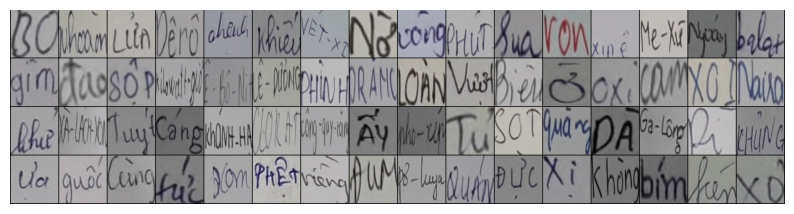

3


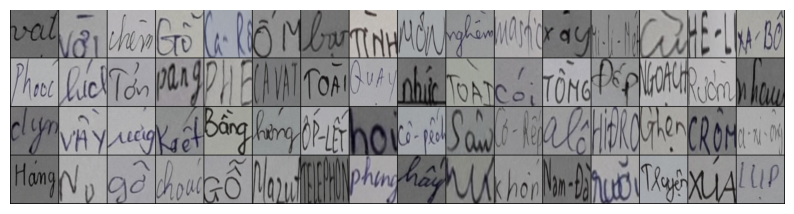

3


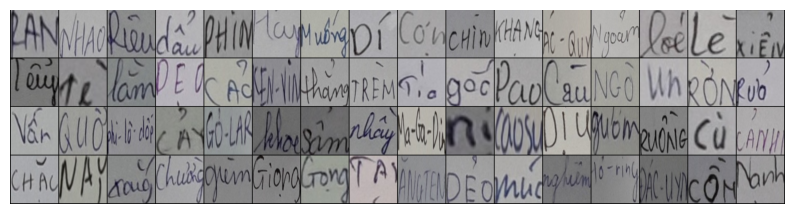

3


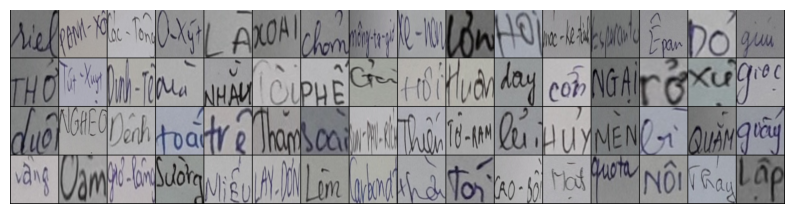

3


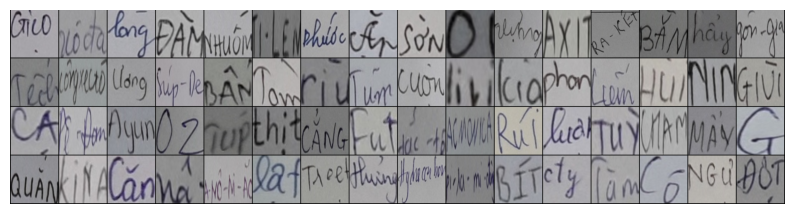

3


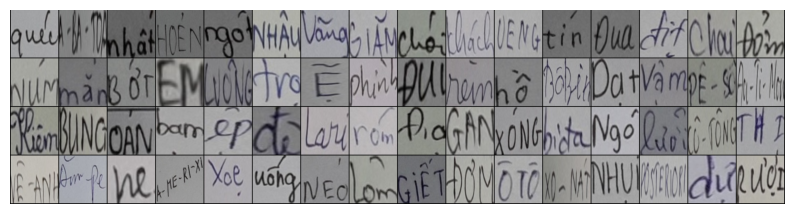

3


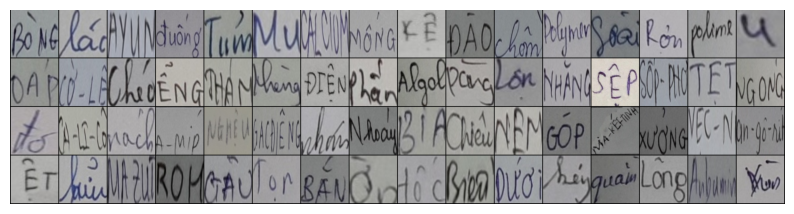

3


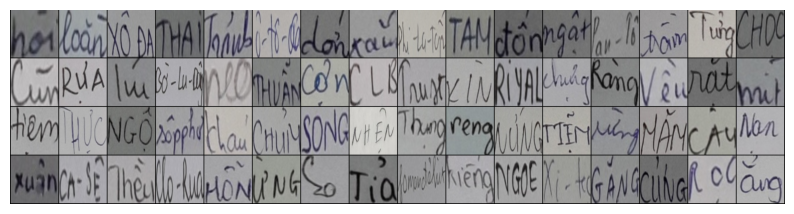

3


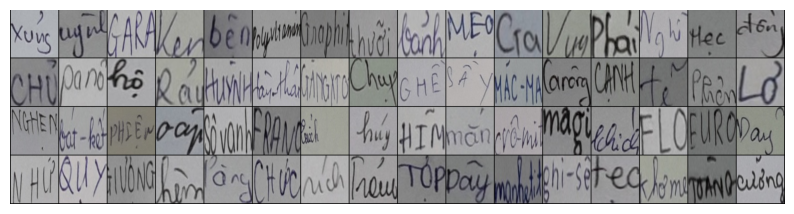

3


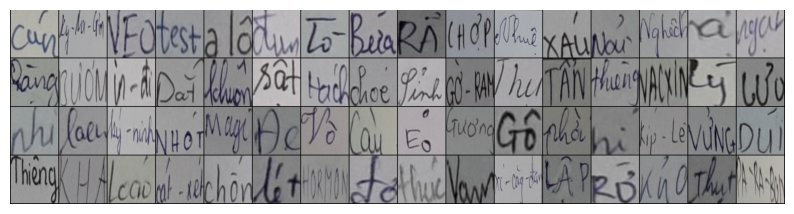

3


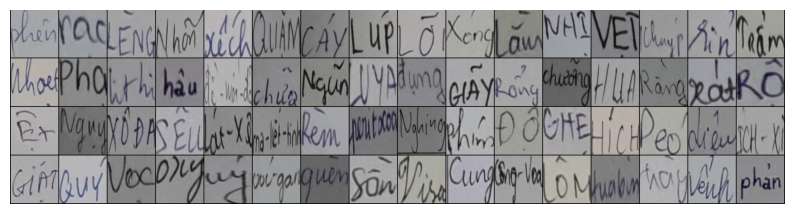

3


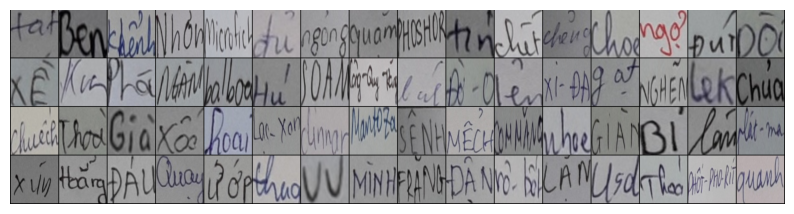

3


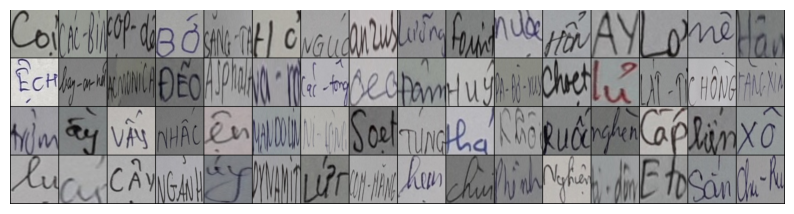

3


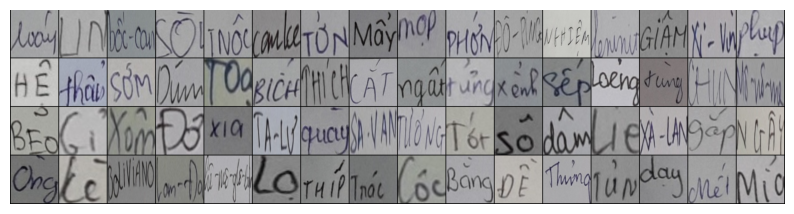

3


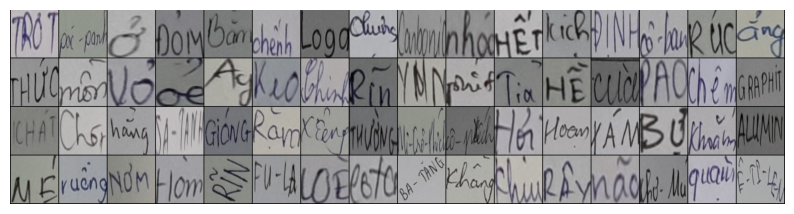

3


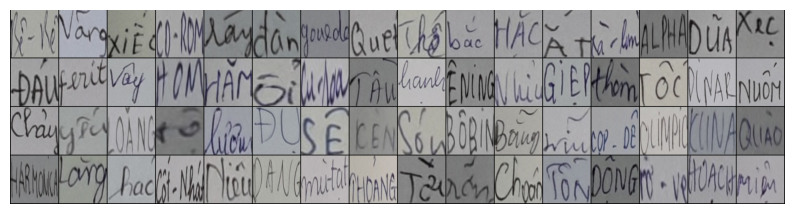

3


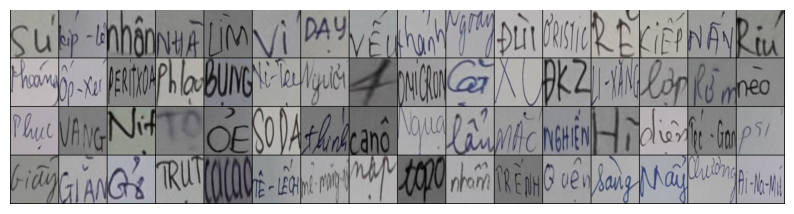

3


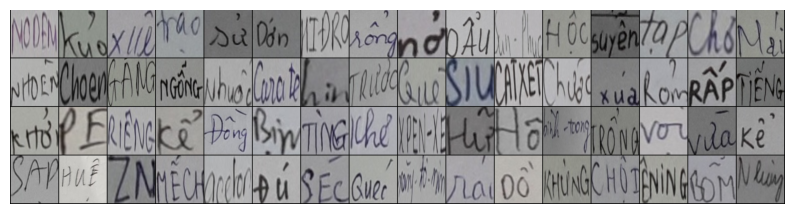

3


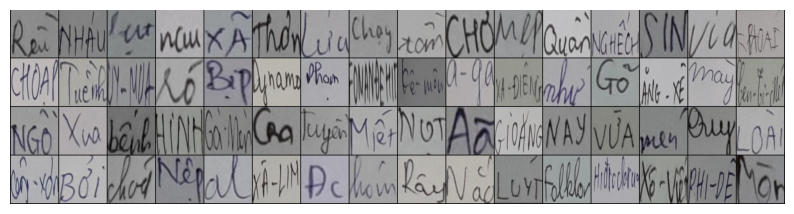

3


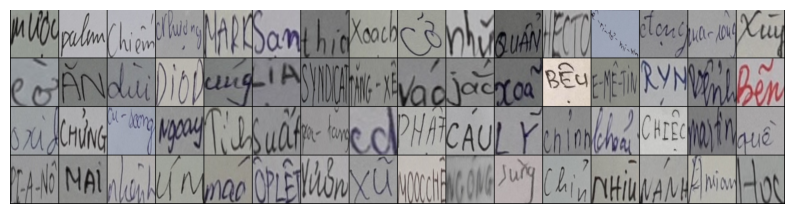

3


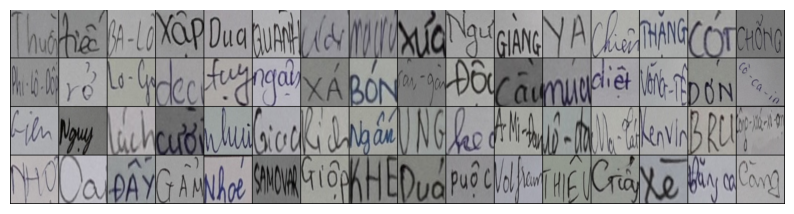

3


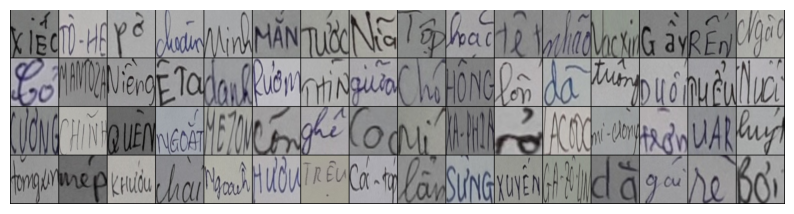

3


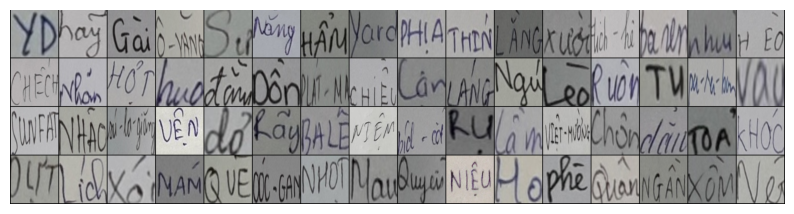

3


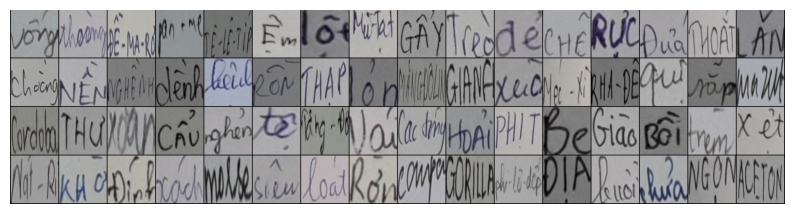

3


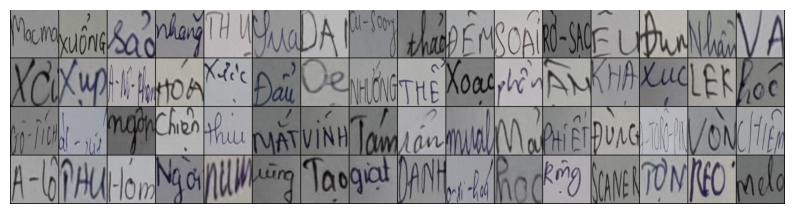

3


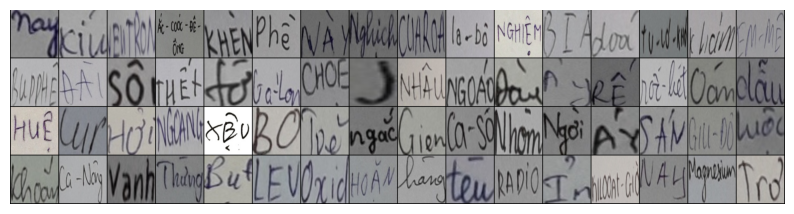

3


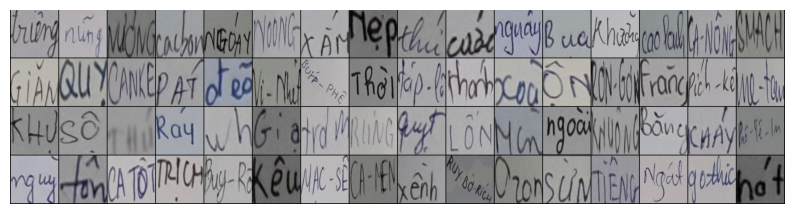

3


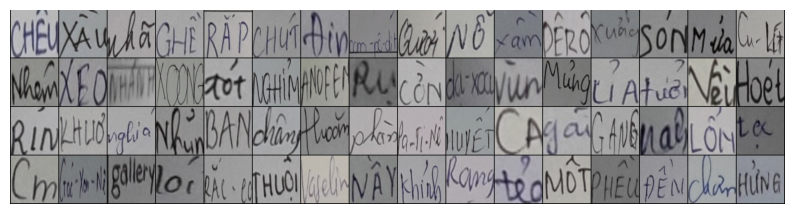

3


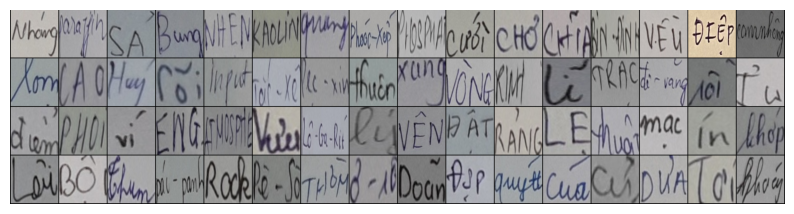

3


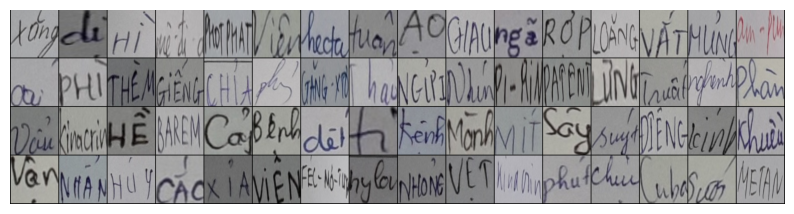

3


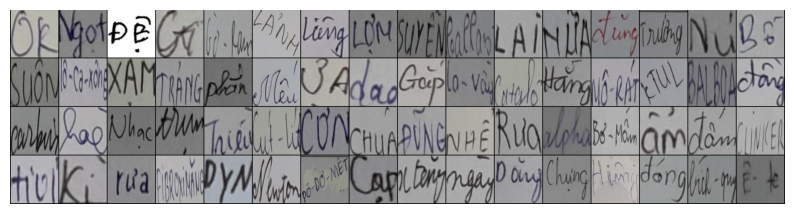

3


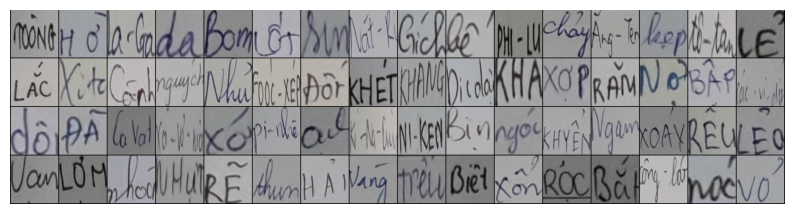

3


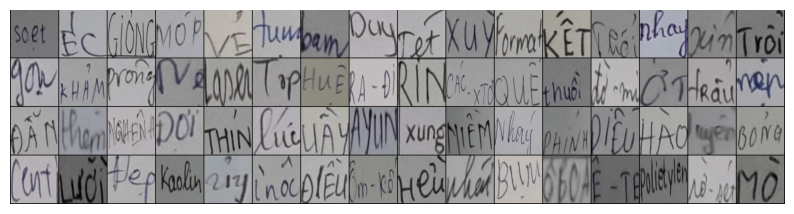

3


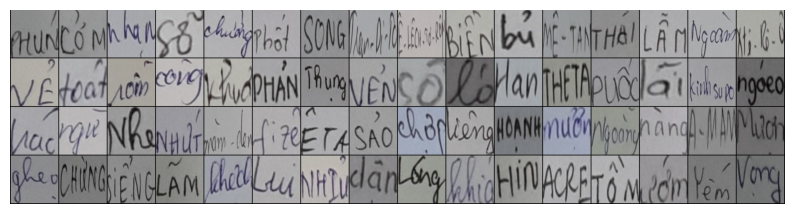

3


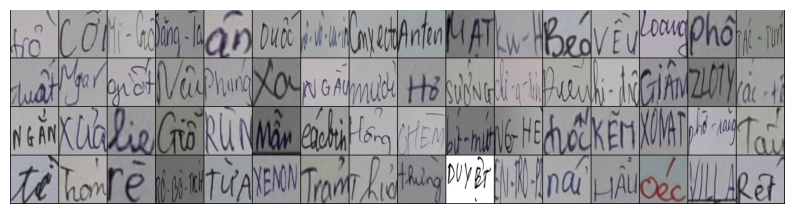

3


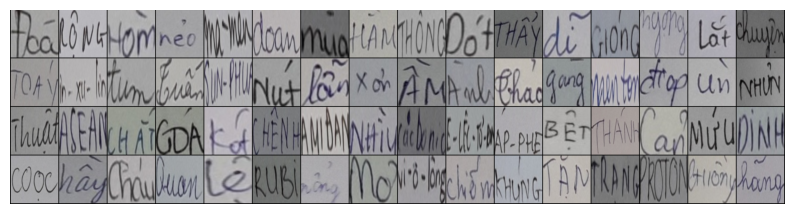

3


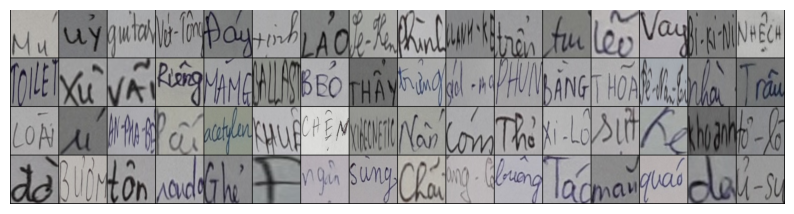

3


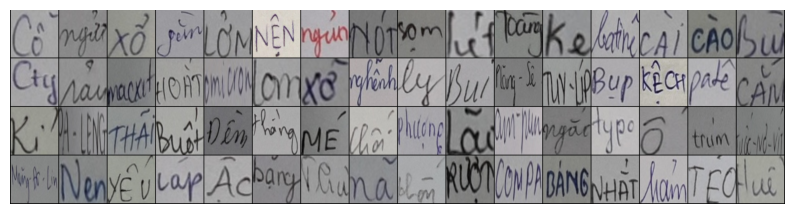

3


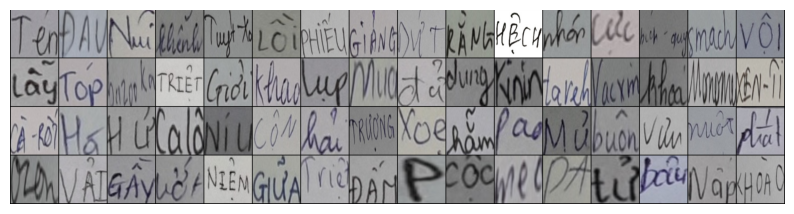

3


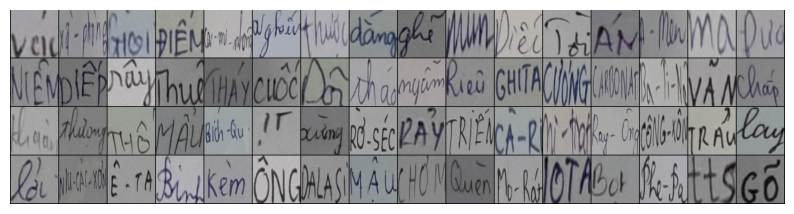

3


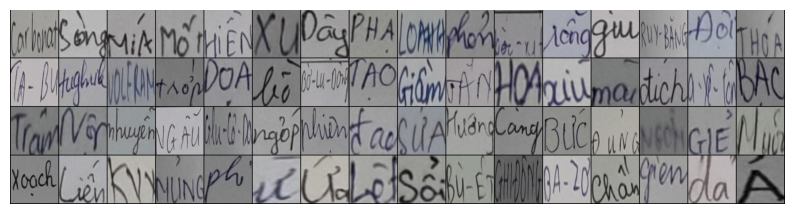

3


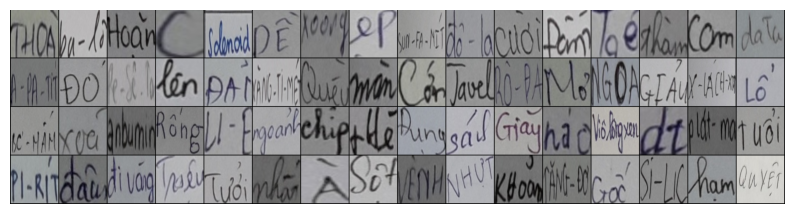

3


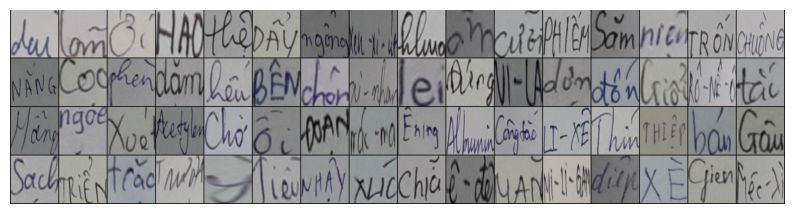

3


KeyboardInterrupt: 

In [3]:
import matplotlib.pyplot as plt
from torchvision import utils



for _, batch in enumerate(train_loader):
    # Assuming 'batch' is a tensor of shape (batch_size, channels, height, width)
    # You can also use torchvision's 'make_grid' to create a grid of images
    for data in batch:
        print(len(batch))
        grid = utils.make_grid(data, nrow=16)  # nrow controls the number of images per row

        # Convert the tensor to a NumPy array for Matplotlib
        grid = grid.numpy()

        # Display the batch of images
        plt.figure(figsize=(10, 10))
        plt.imshow(grid.transpose(1, 2, 0))
        plt.axis('off')
        plt.show()
        break  # Optional: Stop after displaying one batch

In [3]:
from models.propos.byol_wrapper import BYOLWrapper
from network import backbone_dict
# backbone = 'resnet50'
backbone = 'resnet50'
encoder_type, dim_in = backbone_dict[backbone]
encoder = encoder_type()
byol = BYOLWrapper(encoder,
                 num_cluster=num_classes,
                 in_dim=dim_in,
                 temperature=0.5,
                 hidden_size=4096,
                 fea_dim=256,
                 byol_momentum=0.999,
                 symmetric=True,
                 shuffling_bn=True,
                 latent_std=0.001)
checkpoint = '/home/nguyen/NTT/OCR/ProPos/ckpt/byol-103'
msg = byol.load_state_dict(torch.load(checkpoint, map_location='cpu'), strict=False)
print(msg)
encoder = nn.Sequential(byol.encoder_k, byol.projector_k)
encoder = nn.DataParallel(encoder, device_ids=device_ids).cuda().eval()

<All keys matched successfully>


In [11]:
print(msg)

<All keys matched successfully>


In [10]:
print(byol)

BYOLWrapper(
  (encoder_q): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2

In [4]:
from utils import extract_features
mem_features, mem_labels, local_name = extract_features(encoder, train_loader)
# test_features, test_labels = extract_features(encoder, test_loader)

  0%|          | 0/2125 [00:00<?, ?it/s]

100%|██████████| 2125/2125 [13:37<00:00,  2.60it/s]


In [39]:
# print(mem_labels)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
       device='cuda:0')


In [21]:
# print(local_name)
# print(len(local_name))

['train_img_15030.jpg', 'train_img_1783.jpg', 'train_img_18556.jpg', 'train_img_19756.jpg', 'train_img_31426.jpg', 'train_img_36989.jpg', 'train_img_43056.jpg', 'train_img_43502.jpg', 'train_img_47502.jpg', 'train_img_5103.jpg', 'train_img_53247.png', 'train_img_57698.png', 'train_img_67628.png', 'train_img_75559.png', 'train_img_79934.png', 'train_img_81587.png', 'train_img_81702.png', 'train_img_81848.png', 'train_img_92842.png', 'train_img_96833.png', 'train_img_101994.jpg', 'train_img_11624.jpg', 'train_img_17077.jpg', 'train_img_24893.jpg', 'train_img_28536.jpg', 'train_img_42000.jpg', 'train_img_45340.jpg', 'train_img_49542.jpg', 'train_img_51286.png', 'train_img_57482.png', 'train_img_5952.jpg', 'train_img_60014.png', 'train_img_6316.jpg', 'train_img_63912.png', 'train_img_74556.png', 'train_img_82574.png', 'train_img_88437.png', 'train_img_89469.png', 'train_img_89834.png', 'train_img_94467.png', 'train_img_100922.jpg', 'train_img_1113.jpg', 'train_img_19903.jpg', 'train_img_23

In [35]:
kwargs = {
    'metric': 'cosine',
    'distributed': True,
    'random_state': 0,
    'n_clusters': 30,
    'verbose': True
}
from torch_clustering import PyTorchKMeans, evaluate_clustering
clustering_model = PyTorchKMeans(init='k-means++', max_iter=500, tol=1e-4, **kwargs)

psedo_labels = clustering_model.fit_predict(mem_features)



cluster_centers = clustering_model.cluster_centers_
# print(cluster_centers)

nredo 1/10, iteration 064 with inertia 13046.99:  13%|█▎        | 65/500 [00:02<00:16, 26.67it/s]


Converged at iteration 64: center shift -2.384185791015625e-07 within tolerance 8.927864669772134e-09 and min inertia 13046.98828125.


nredo 2/10, iteration 125 with inertia 13054.56:  25%|██▌       | 126/500 [00:04<00:13, 27.01it/s]


Converged at iteration 125: center shift -1.1920928955078125e-07 within tolerance 8.927864669772134e-09 and min inertia 13046.98828125.


nredo 3/10, iteration 099 with inertia 13065.59:  20%|██        | 100/500 [00:03<00:15, 26.48it/s]


Converged at iteration 99: strict convergence.


nredo 4/10, iteration 064 with inertia 13054.43:  13%|█▎        | 65/500 [00:02<00:16, 26.43it/s]


Converged at iteration 64: center shift -2.384185791015625e-07 within tolerance 8.927864669772134e-09 and min inertia 13046.98828125.


nredo 5/10, iteration 093 with inertia 13133.50:  19%|█▉        | 94/500 [00:03<00:15, 26.42it/s]


Converged at iteration 93: center shift -5.960464477539062e-07 within tolerance 8.927864669772134e-09 and min inertia 13046.98828125.


nredo 6/10, iteration 161 with inertia 13018.63:  32%|███▏      | 162/500 [00:06<00:12, 26.55it/s]


Converged at iteration 161: center shift 0.0 within tolerance 8.927864669772134e-09 and min inertia 13018.6337890625.


nredo 7/10, iteration 141 with inertia 13037.98:  28%|██▊       | 142/500 [00:05<00:13, 26.54it/s]


Converged at iteration 141: center shift -4.172325134277344e-07 within tolerance 8.927864669772134e-09 and min inertia 13018.6337890625.


nredo 8/10, iteration 180 with inertia 13000.40:  36%|███▌      | 181/500 [00:06<00:12, 26.51it/s]


Converged at iteration 180: strict convergence.


nredo 9/10, iteration 101 with inertia 13130.54:  20%|██        | 102/500 [00:03<00:14, 26.92it/s]


Converged at iteration 101: center shift 0.0 within tolerance 8.927864669772134e-09 and min inertia 13000.40234375.


nredo 10/10, iteration 099 with inertia 13090.38:  20%|██        | 100/500 [00:03<00:15, 26.63it/s]

Converged at iteration 99: strict convergence.
Final min inertia 13000.40234375.


In [42]:
print(psedo_labels)

tensor([1, 1, 3, 5, 3, 3, 4, 1, 5, 3, 3, 3, 0, 2, 5, 4, 0, 4, 4, 2, 1, 5, 5, 5,
        3, 3, 3, 1, 4, 4, 5, 0, 3, 0, 5, 2, 1, 4, 1, 0, 3, 5, 1, 1, 5, 3, 1, 0,
        4, 3, 0, 4, 2, 4, 5, 0, 4, 4, 4, 2, 1, 5, 5, 1, 0, 5, 3, 3, 5, 1, 3, 2,
        4, 2, 4, 1, 0, 4, 4, 4, 5, 5, 1, 1, 3, 1, 3, 1, 3, 5, 3, 2, 0, 0, 0, 4,
        0, 0, 4, 3, 5, 4, 5, 3, 0, 1, 1, 1, 0, 5, 3, 0, 4, 2, 5, 3, 5, 0, 4, 0],
       device='cuda:0')


In [36]:
psedo_labels_list = psedo_labels.tolist()

In [29]:
print(psedo_labels_list)

[4, 3, 2, 3, 1, 1, 4, 1, 3, 2, 3, 3, 5, 1, 0, 0, 5, 5, 5, 2, 2, 4, 1, 2, 4, 2, 3, 1, 4, 4, 4, 5, 2, 4, 4, 3, 3, 0, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 5, 3, 4, 5, 0, 4, 1, 4, 5, 5, 5, 5, 1, 4, 4, 1, 1, 2, 1, 2, 2, 2, 4, 3, 5, 3, 0, 1, 5, 4, 4, 3, 3, 4, 1, 3, 2, 2, 2, 4, 3, 1, 2, 5, 5, 5, 4, 4, 4, 4, 0, 1, 2, 4, 3, 2, 4, 1, 1, 4, 0, 1, 2, 4, 5, 3, 1, 2, 2, 4, 4, 4]


In [37]:
cluster_folder = {}
for i in range(len(psedo_labels_list)):
    class_name = str(psedo_labels_list[i])
    if class_name not in cluster_folder:
        cluster_folder[class_name] = []
        cluster_folder[class_name].append(local_name[i])
    else:
        cluster_folder[class_name].append(local_name[i])

In [27]:
cluster_folder.keys()

dict_keys(['1', '5', '8', '0', '9', '4', '7', '6', '2', '3'])

In [49]:
pwd

'/home/nguyen/NTT/OCR/ProPos'

In [53]:
#make folder to clustering
# paths = '/home/nguyen/NTT/OCR/ProPos/'
# clusted_folder_dir = 'Clusted'

# os.makedirs(paths + clusted_folder_dir)
# for i in cluster_folder:
# find DATA/ocr_dataset/new_public_test -type f -exec cp {} DATA/ocr_dataset/new_train/ \;

In [38]:
import os
paths = '/home/nguyen/NTT/OCR/ProPos/cluster-byol-103-30/'
os.mkdir(paths)

In [34]:
import shutil
# import os

# paths = '/home/nguyen/NTT/OCR/ProPos/cluster-byol-103-15/'
# os.mkdir(paths)
path_to_all_data = '/home/nguyen/NTT/OCR/ProPos/DATA/ocr_dataset/new_train/'
for i in cluster_folder:
    #make folder
    class_folder = paths + i 
    os.mkdir(class_folder)
    
    for file_image_name in cluster_folder[i]:
        shutil.copy(path_to_all_data + file_image_name, class_folder)
    

In [47]:
print(len(cluster_centers))

6


In [20]:
results = evaluate_clustering(mem_labels.cpu().numpy(), psedo_labels.cpu().numpy(), eval_metric=['nmi'])

In [21]:
results

{'train_nmi': 0.11070533089504354}